In [1]:
%matplotlib inline

import cosima_cookbook as cc
import matplotlib.pyplot as plt
import numpy as np
import netCDF4 as nc
import cartopy.crs as ccrs
import xarray as xr
import cmocean.cm as cmocean
import glob
import matplotlib.path as mpath
import matplotlib.colors as col
from netCDF4 import Dataset


import logging
logging.captureWarnings(True)
logging.getLogger('py.warnings').setLevel(logging.ERROR)

from dask.distributed import Client

figdir = '/g/data/e14/pc5520/figures/basal_melt_param/'

In [2]:
client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/40185/status,
Dashboard: /proxy/40185/status,Workers: 5
Total threads: 20,Total memory: 128.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39049,Workers: 5
Dashboard: /proxy/40185/status,Total threads: 20
Started: Just now,Total memory: 128.00 GiB
Comm: tcp://127.0.0.1:32993,Total threads: 4
Dashboard: /proxy/34573/status,Memory: 25.60 GiB
Nanny: tcp://127.0.0.1:46129,


In [3]:
# build database for these experiments:
observations = 'TS_data'
session_data = '/g/data/e14/pc5520/model_data/access-om2/basal_melt_MOM5/TS_data.db'
obs_session = cc.database.create_session(session_data)
dir_TSobs = ['/g/data/e14/pc5520/TS_data/']
cc.database.build_index(dir_TSobs,obs_session)

Indexing experiment: TS_data


0it [00:00, ?it/s]


0

In [4]:
#Import obs
salt_obs = cc.querying.getvar(observations, 'Sal', obs_session, ncfile='TS_Climato_Antarctic60S.nc')

temp_obs = cc.querying.getvar(observations, 'Temp', obs_session, ncfile='TS_Climato_Antarctic60S.nc')

In [5]:
start_time='2154-01-01'
end_time='2155-01-01'

lat_slice  = slice(-80,-59)

In [6]:
# database for control simulation:
master_session = cc.database.create_session('/g/data/ik11/databases/cosima_master.db')
control = '01deg_jra55v13_ryf9091'

# database for perturbations:
basal_session = cc.database.create_session('/g/data/v45/akm157/model_data/access-om2/01deg_jra55v13_ryf9091_easterlies_up10/easterlies.db')
# 10% increase in easterly wind speed:
easterlies_up = '01deg_jra55v13_ryf9091_easterlies_up10'
# 10% decrease in easterly wind speed:
easterlies_down = '01deg_jra55v13_ryf9091_easterlies_down10'

In [9]:
master_session = cc.database.create_session()

control = '01deg_jra55v13_ryf9091'

# salterature of meltwater at the freezing point calculated with the in situ salinity:
Tfreezing_insituS = 'accessom2-GPC004'
# temperature of meltwater at the freezing point calculated with the 0 salinity:
Tfreezing_zeroS = 'accessom2-GPC005'
# temperature of meltwater equal to the minimum of the above two temperatures:
Tfreezing_min = 'accessom2-GPC006'
# idem GPC006 but BG03 like, basal distributed between front and 50m deeper:
Tfreezing_min_bg03 = 'accessom2-GPC007'
# temperature of meltwater equal to the minimum of the above two temperatures:
Tfreezing_min_s0 = 'accessom2-GPC008'

In [10]:
# build database for these experiments:
session_name = '/g/data/e14/pc5520/model_data/access-om2/basal_melt_MOM5/basal_melt_MOM5.db'
basal_melt_session = cc.database.create_session(session_name)

dir_list = ['/g/data/e14/pc5520/access-om2/archive/01deg_jra55v13_ryf9091_rerun_for_easterlies/accessom2-GPC004/',
           '/g/data/e14/pc5520/access-om2/archive/01deg_jra55v13_ryf9091_rerun_for_easterlies/accessom2-GPC005/',
           '/g/data/e14/pc5520/access-om2/archive/01deg_jra55v13_ryf9091_rerun_for_easterlies/accessom2-GPC006/',
           '/g/data/e14/pc5520/access-om2/archive/01deg_jra55v13_ryf9091_rerun_for_easterlies/accessom2-GPC007/',
           '/g/data/e14/pc5520/access-om2/archive/01deg_jra55v13_ryf9091_rerun_for_easterlies/accessom2-GPC008/']
cc.database.build_index(dir_list,basal_melt_session)

Indexing experiment: accessom2-GPC004


0it [00:00, ?it/s]

Indexing experiment: accessom2-GPC005



0it [00:00, ?it/s]


Indexing experiment: accessom2-GPC006


0it [00:00, ?it/s]


Indexing experiment: accessom2-GPC007


0it [00:00, ?it/s]


Indexing experiment: accessom2-GPC008


0it [00:00, ?it/s]


0

In [11]:
# topography data for plotting:
ht = cc.querying.getvar(control,'ht' , master_session,n=1).sel(yt_ocean=lat_slice)
land_mask = np.squeeze(ht.values)*0
land_mask[np.isnan(land_mask)] = 1
land_mask = np.where(land_mask==1,land_mask,np.nan)
land_mask_masked = np.ma.masked_where((land_mask==0),land_mask)
# make land go all the way to -90S:
land_mask_lat = ht.yt_ocean.values
land_mask_lat[0] = -90

In [12]:
salt_con = cc.querying.getvar(control, 'salt', master_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
salt_con = salt_con.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

#salt_Tfreezing_min = cc.querying.getvar(Tfreezing_min, 'salt', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
#salt_Tfreezing_min = salt_Tfreezing_min.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)


salt_Tfreezing_min_s0 = cc.querying.getvar(Tfreezing_min_s0, 'salt', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time)
salt_Tfreezing_min_s0 = salt_Tfreezing_min_s0.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

In [13]:
temp_con = cc.querying.getvar(control, 'temp', master_session, frequency='1 monthly',start_time=start_time, end_time=end_time) - 273.15
temp_con = temp_con.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

#temp_Tfreezing_min = cc.querying.getvar(Tfreezing_min, 'temp', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time) - 273.15
#temp_Tfreezing_min = temp_Tfreezing_min.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

temp_Tfreezing_min_s0 = cc.querying.getvar(Tfreezing_min_s0, 'temp', basal_melt_session, frequency='1 monthly',start_time=start_time, end_time=end_time) - 273.15
temp_Tfreezing_min_s0 = temp_Tfreezing_min_s0.sel(time=slice(start_time,end_time)).sel(yt_ocean=lat_slice)

In [14]:
def plot_obs(zz=None,tt=None,var_simu=None,var_obs=None,var_con=None,vmin=33,vmax=35):

    fontsize=16

    fig=plt.figure(figsize=(20,16))
    
    #Find kk
    st_ocean = var_simu.st_ocean.values
    kk_sim = np.argmin(abs(st_ocean-zz))
    
    depth = var_obs.depth.values
    kk_obs = np.argmin(abs(depth-zz))
    
    norm = col.Normalize(vmin=vmin,vmax=vmax)

    #Obs temp
    
    xx, yy = np.meshgrid(var_obs.lon,var_obs.lat)

    ax = fig.add_axes([0.0, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    ## plot:
    cf = ax.pcolormesh(xx, yy, var_obs[:,:,tt,kk_obs].transpose(), norm=norm,
                   cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Observations',fontsize=fontsize)
    #ax.contourf(ht.xt_ocean, land_mask_lat,land_mask_masked,colors='darkgrey',
    #             zorder=2,transform = ccrs.PlateCarree())
    ax.set_extent([-180, 180, -90, -59.5], ccrs.PlateCarree())
    
        #### Control:
    ax = fig.add_axes([0.3, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_con.xt_ocean,var_con.yt_ocean,var_con[tt,kk_sim,:,:],norm=norm,
                       cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Control',fontsize=fontsize)
    
    #### Tfreezing_min:
    ax = fig.add_axes([0.6, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_simu.xt_ocean,var_simu.yt_ocean,var_simu[tt,kk_sim,:,:],norm=norm,
                       cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Tfreezing',fontsize=fontsize)
    
    # colorbar:
    cbaxes = fig.add_axes([0.93, 0.25, 0.012, 0.5])
    cbar = plt.colorbar(pcm, cax = cbaxes, orientation = 'vertical',extend = 'both')
    #cbar.set_label(r'Temperature obs',fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=fontsize)

In [25]:
def plot_obs_diff(zz=None,tt=None,var_simu=None,var_obs=None,var_con=None,vmin=33,vmax=35, scale_max=0.15):

    fontsize=16

    fig=plt.figure(figsize=(20,16))
    
    #Find kk
    st_ocean = var_simu.st_ocean.values
    kk_sim = np.argmin(abs(st_ocean-zz))
    
    depth = var_obs.depth.values
    kk_obs = np.argmin(abs(depth-zz))
    
    norm = col.Normalize(vmin=vmin,vmax=vmax)

    #Obs temp
    
    xx, yy = np.meshgrid(var_obs.lon,var_obs.lat)

    ax = fig.add_axes([0.0, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    ## plot:
    cf = ax.pcolormesh(xx, yy, var_obs[:,:,tt,kk_obs].transpose(), norm=norm,
                   cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Observations',fontsize=fontsize)
    #ax.contourf(ht.xt_ocean, land_mask_lat,land_mask_masked,colors='darkgrey',
    #             zorder=2,transform = ccrs.PlateCarree())
    ax.set_extent([-180, 180, -90, -59.5], ccrs.PlateCarree())
    
        #### Control:
    ax = fig.add_axes([0.3, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_con.xt_ocean,var_con.yt_ocean,var_con[tt,kk_sim,:,:],norm=norm,
                       cmap = cmocean.cm.jet, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Control',fontsize=fontsize)
    
    #### Tfreezing_min:
    norm2 = col.Normalize(vmin=-scale_max,vmax=scale_max)
    
    ax = fig.add_axes([0.6, 0.0, 0.3, 1],projection=ccrs.SouthPolarStereo())
    theta = np.linspace(0, 2*np.pi, 100)
    center, radius = [0.5, 0.5], 0.5
    verts = np.vstack([np.sin(theta), np.cos(theta)]).T
    circle = mpath.Path(verts * radius + center)
    ax.set_boundary(circle, transform=ax.transAxes)
    pcm = ax.pcolormesh(var_simu.xt_ocean,var_simu.yt_ocean,var_simu[tt,kk_sim,:,:] - var_con[tt,kk_sim,:,:],norm=norm2,
                       cmap = cmocean.balance, transform = ccrs.PlateCarree())
    ax.contour(ht.xt_ocean,ht.yt_ocean,ht,levels=[1000,3000],colors='k',linewidths=0.5,transform = ccrs.PlateCarree())
    plt.title('Tfreezing',fontsize=fontsize)
    
    # colorbar:
    cbaxes = fig.add_axes([0.93, 0.25, 0.012, 0.5])
    cbar = plt.colorbar(pcm, cax = cbaxes, orientation = 'vertical',extend = 'both')
    #cbar.set_label(r'Temperature obs',fontsize=fontsize,labelpad=2)
    cbar.ax.tick_params(labelsize=fontsize)

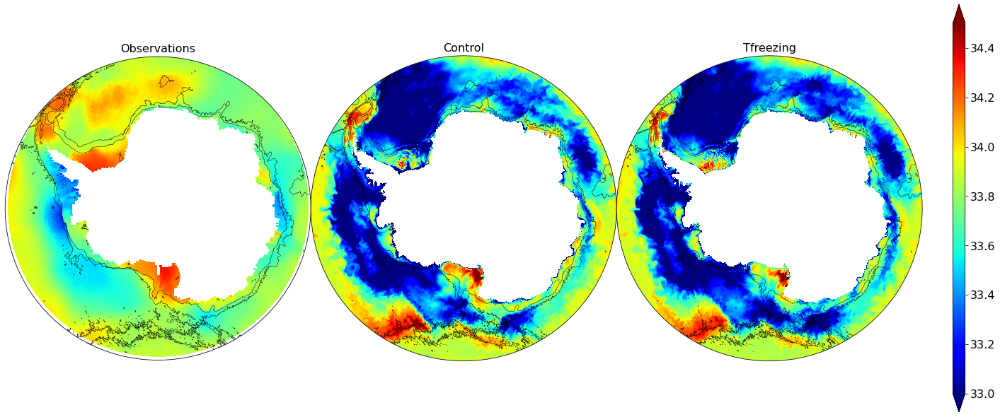

In [29]:
plot_obs(zz=10,tt=0,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5)

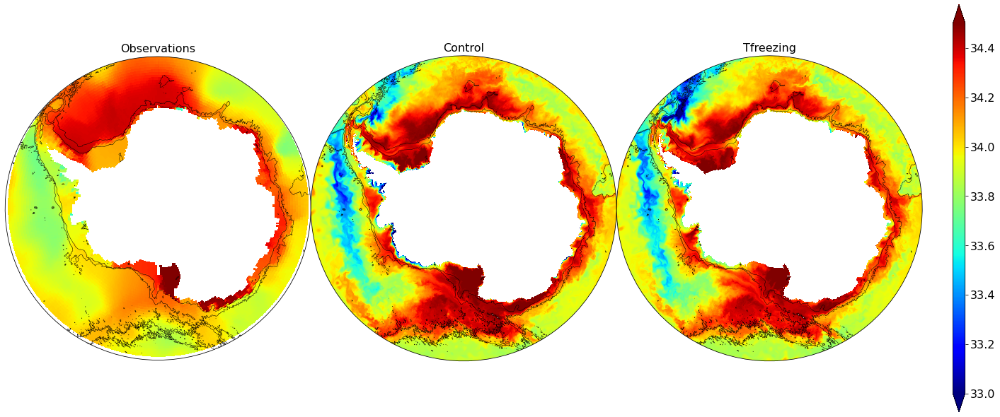

In [30]:
plot_obs(zz=10,tt=6,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5)

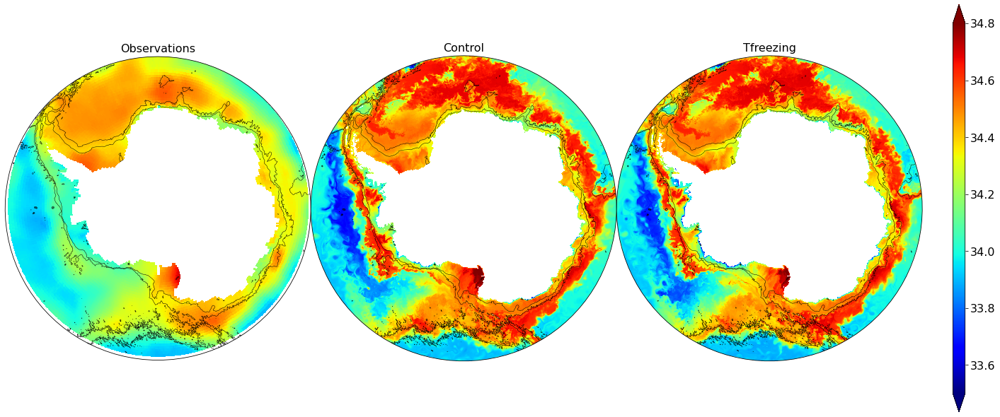

In [31]:
plot_obs(zz=100,tt=0,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8)

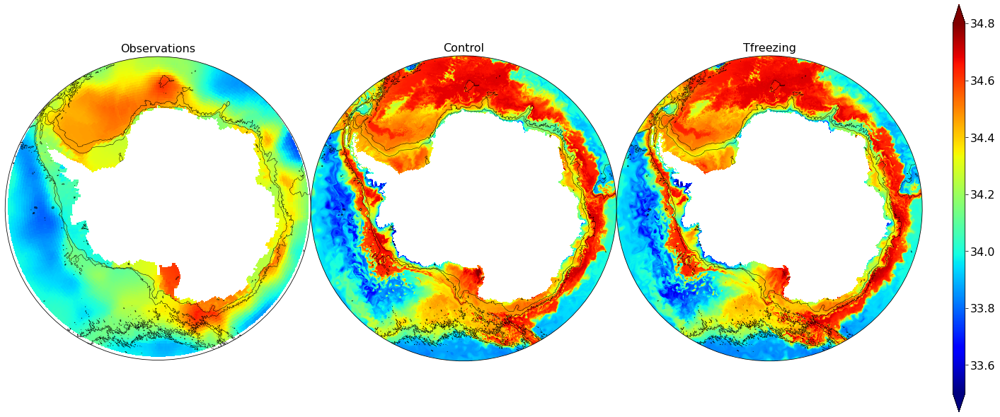

In [32]:
plot_obs(zz=100,tt=6,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8)

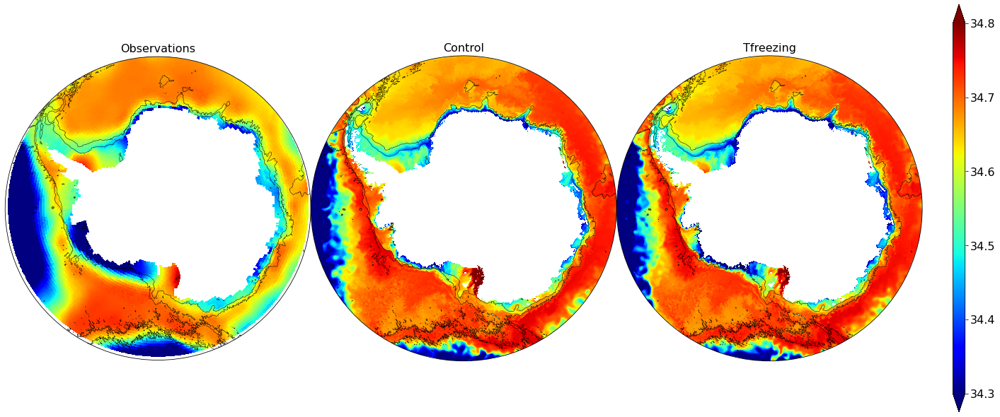

In [33]:
plot_obs(zz=300,tt=0,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

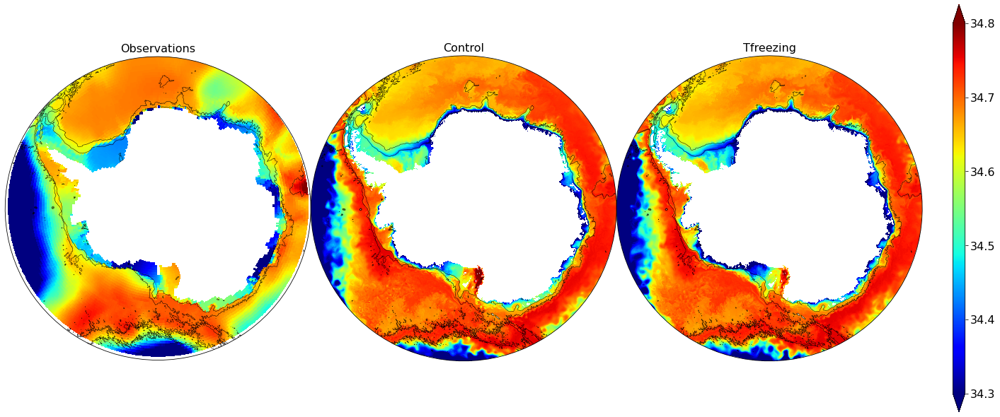

In [34]:
plot_obs(zz=300,tt=6,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

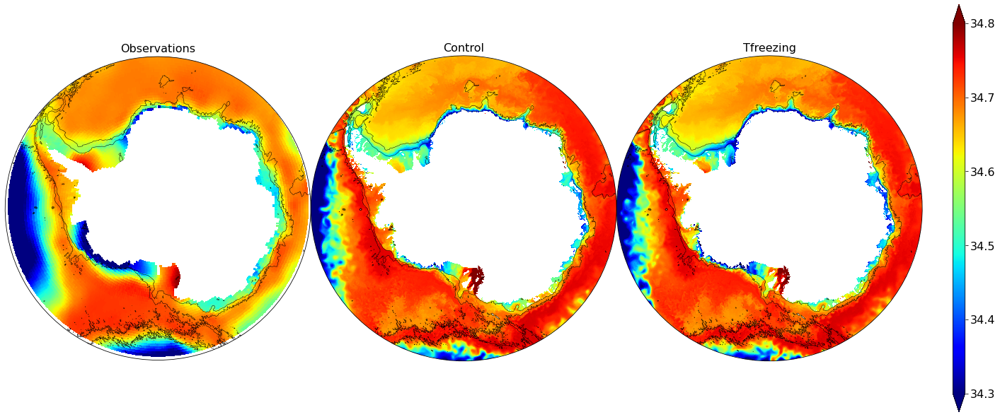

In [37]:
plot_obs(zz=380,tt=0,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

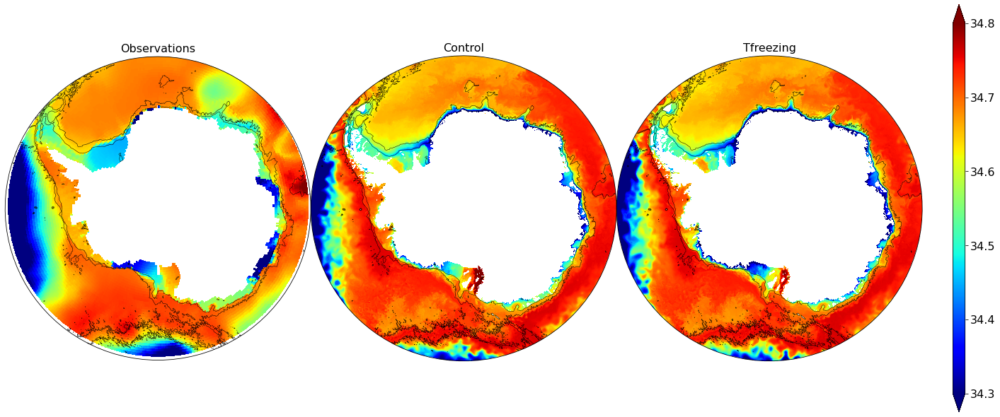

In [38]:
plot_obs(zz=380,tt=6,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8)

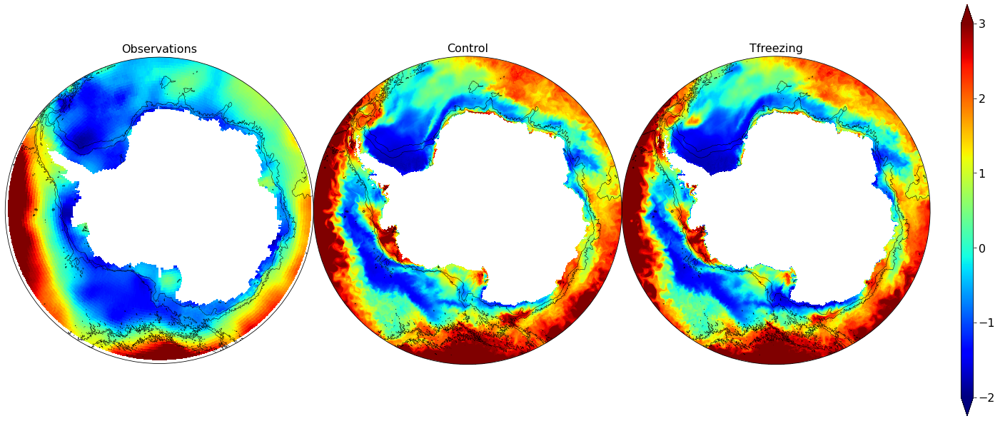

In [43]:
plot_obs(zz=10,tt=0,var_simu=temp_Tfreezing_min_s0,var_obs=temp_obs,var_con=temp_con,vmin=-2,vmax=3)

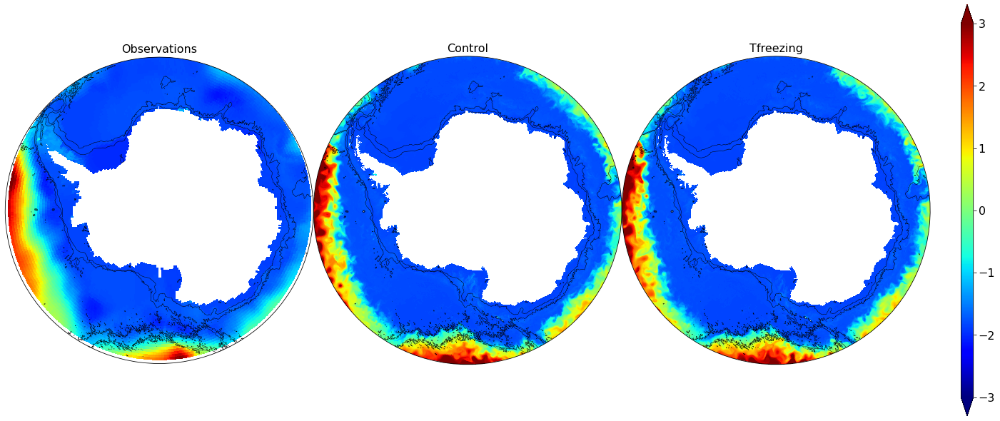

In [46]:
plot_obs(zz=10,tt=6,var_simu=temp_Tfreezing_min_s0,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

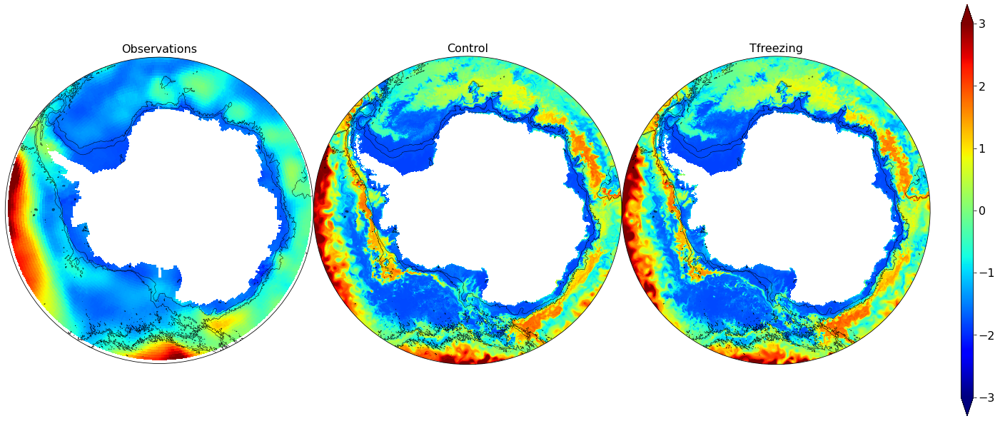

In [15]:
plot_obs(zz=100,tt=0,var_simu=temp_Tfreezing_min_s0,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

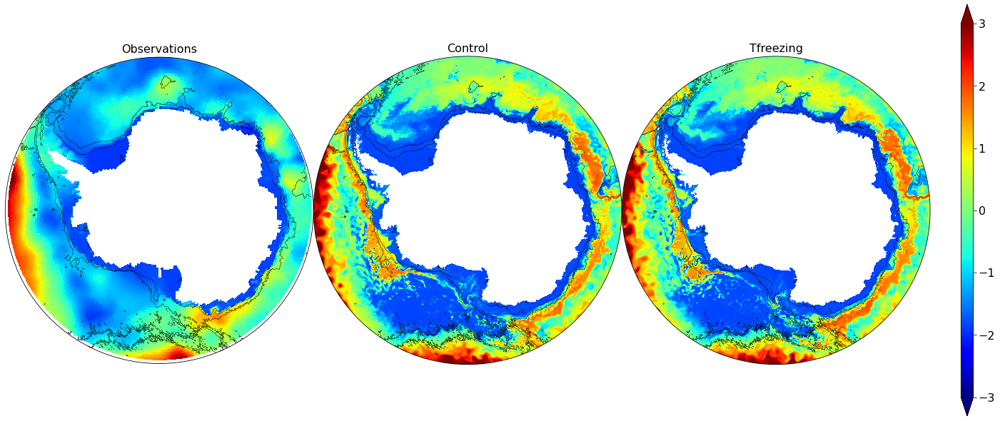

In [16]:
plot_obs(zz=100,tt=6,var_simu=temp_Tfreezing_min_s0,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

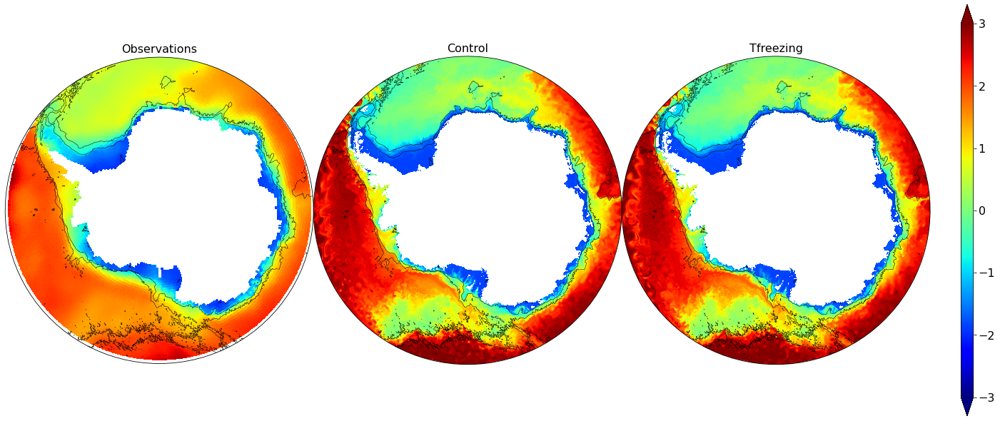

In [17]:
plot_obs(zz=300,tt=0,var_simu=temp_Tfreezing_min_s0,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

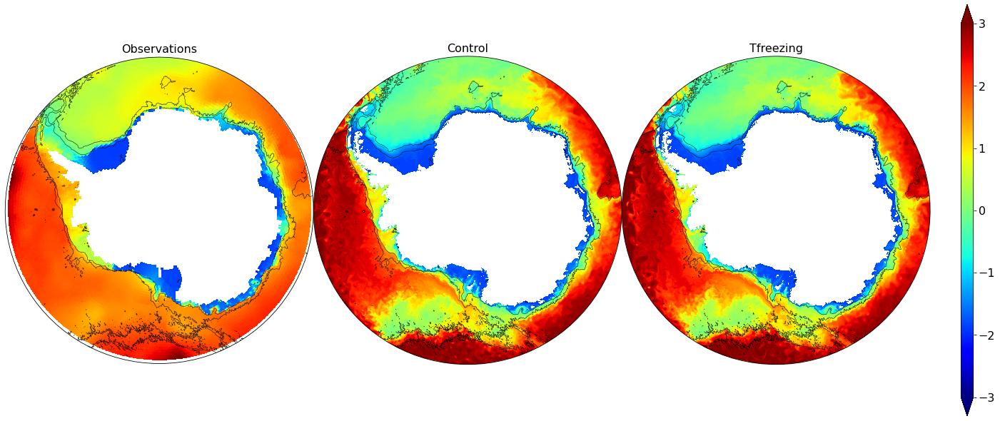

In [18]:
plot_obs(zz=300,tt=6,var_simu=temp_Tfreezing_min_s0,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

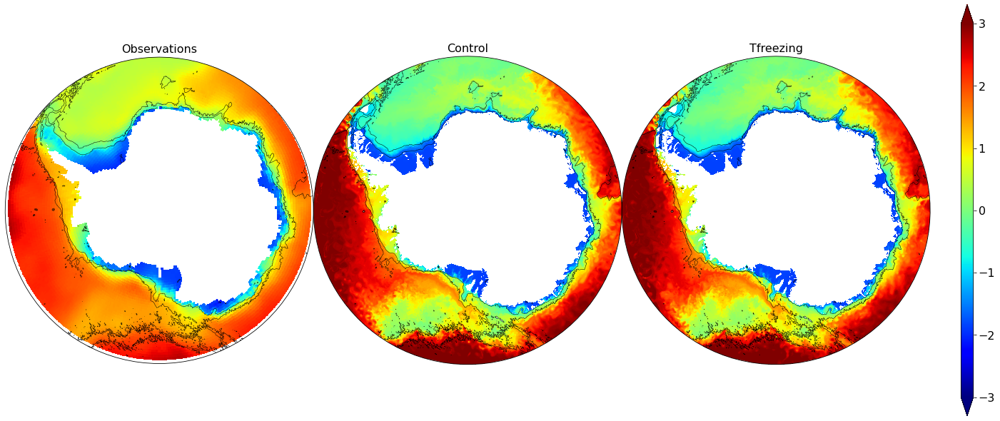

In [19]:
plot_obs(zz=380,tt=0,var_simu=temp_Tfreezing_min_s0,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

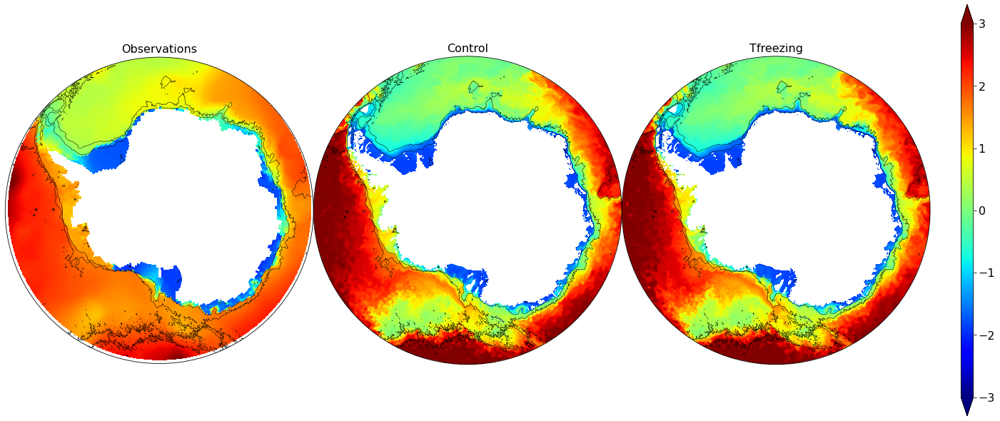

In [20]:
plot_obs(zz=380,tt=6,var_simu=temp_Tfreezing_min_s0,var_obs=temp_obs,var_con=temp_con,vmin=-3,vmax=3)

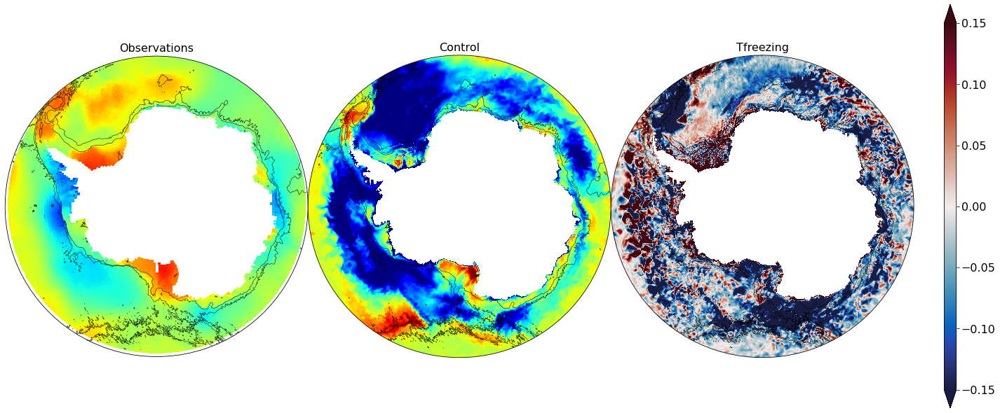

In [30]:
plot_obs_diff(zz=10,tt=0,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5,scale_max=0.15)

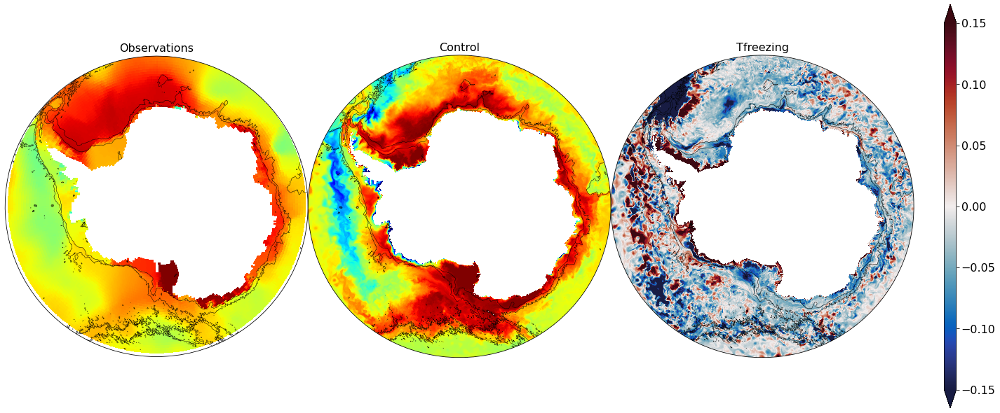

In [31]:
plot_obs_diff(zz=10,tt=6,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=33,vmax=34.5,scale_max=0.15)

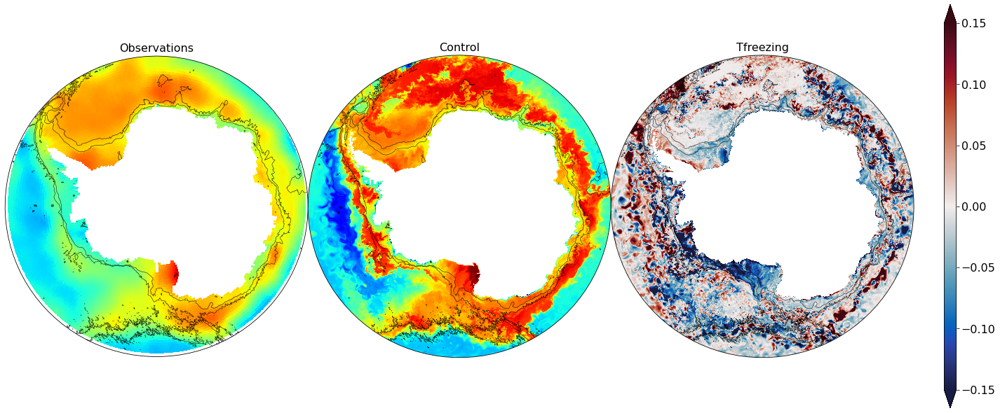

In [32]:
plot_obs_diff(zz=100,tt=0,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8,scale_max=0.15)

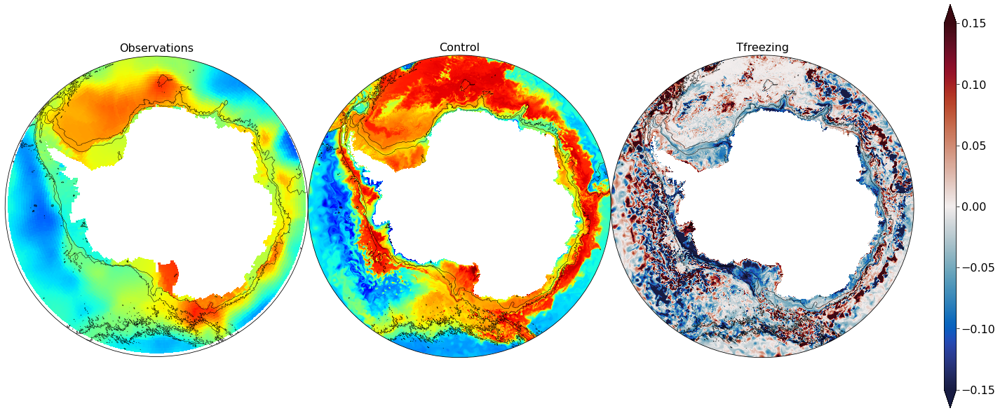

In [33]:
plot_obs_diff(zz=100,tt=6,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=33.5,vmax=34.8,scale_max=0.15)

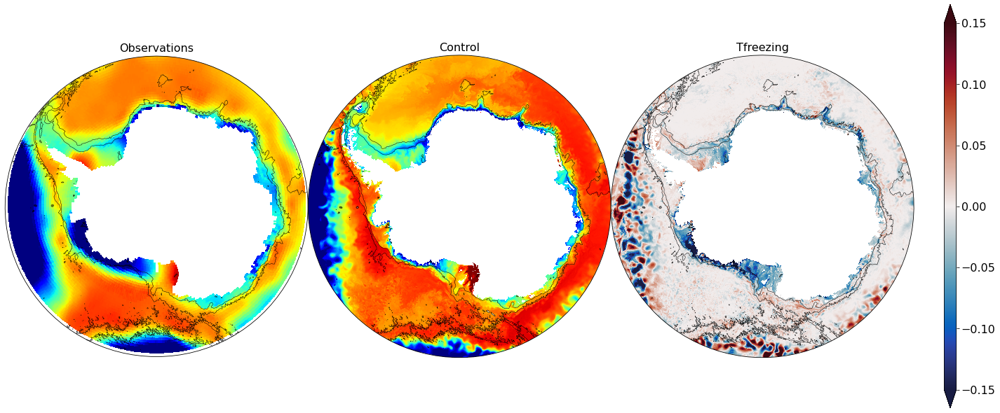

In [34]:
plot_obs_diff(zz=300,tt=0,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8,scale_max=0.15)

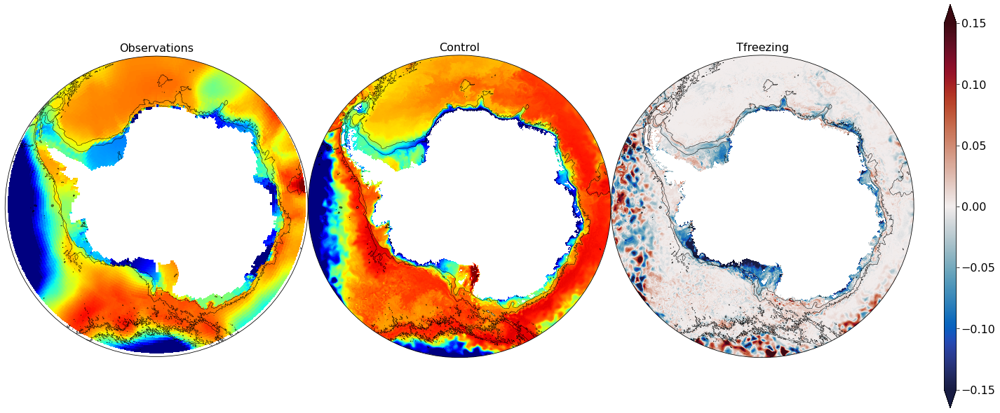

In [35]:
plot_obs_diff(zz=300,tt=6,var_simu=salt_Tfreezing_min_s0,var_obs=salt_obs,var_con=salt_con,vmin=34.3,vmax=34.8,scale_max=0.15)